# CAPSTONE PROJECT (BOSTON CRIME DATASET)

## 1. Data Preparation and Overview
Bab ini akan menerangkan mengenai latar belakang masalah yang akan dibahas dan dianalisis, persiapan-persiapan yang harus dilakukan sebelum analisis data dan juga overview singkat dari dataset yang akan dianalisis.

### 1.1 Introduction

**Background and Objectives**

Laporan tindak kriminal yang terjadi di daerah boston disimpan oleh pihak kepolisian dalam sebuah file laporan kriminal. Dari dataset tersebut, seorang data scientist ingin menganalisis lebih lanjut guna mendapatkan insight kriminalitas di Boston. Dengan insight ini, **diharapkan pihak kepolisian Boston bisa melakukan pencegahan dan penanganan tindak kriminal secara efektif**. 

Projek ini akan berfokus pada analisis pola kriminalitas di Boston dengan melihat fitur-fitur pendukung (kolom) pada dataset. Dimulai dari general analysis hingga spesific analysis yang dimana akan menganalisis **tindak kriminal yang berkategori berat dan sedang**. Objektif dari projek ini diantaranya adalah:
- Meninjau jenis tindak kejahatan di Boston
- Meninjau pola perubahan tindak kejahatan di Boston dari tahun ke tahun
- Meninjau pengaruh hari dan waktu terhadap tingkat tindak kriminal di Boston
- Meninjau distrik-distrik di Boston yang paling sering terjadi tindak kriminal 
- Meninjau keterkaitan antara waktu terhadap 4 tindak kriminal terbanyak yang dikategorikan sebagai tindak kriminal berat dan sedang
- Meninjau keterkaitan antara distrik terhadap 4 tindak kriminal terbanyak yang dikategorikan sebagai tindak kriminal berat dan sedang


### 1.2 Library

In [437]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
import datetime
import calendar
import folium
import re
from folium.plugins import HeatMap
from scipy.stats import chi2_contingency

### 1.3 Read and Save Variabel DataFrame

In [438]:
df=pd.read_csv('crime.csv',parse_dates=["OCCURRED_ON_DATE"],encoding='windows-1254')
df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


### 1.4 Feature/Column Description

Deskripsi untuk masing masing feature:
- INCIDENT_NUMBER:      ID laporan tindak kriminal
- OFFENSE_CODE:         Kode yang berkorelasi dengan Jenis tindak kriminal
- OFFENSE_CODE_GROUP:   Jenis tindak kriminal
- OFFENSE_DESCRIPTION:  Penjelasan lebih detail mengenai tindak kriminal yang terjadi
- DISTRICT:             Distrik dimana terjadinya tindak kriminal
- REPORTING_AREA:       Kode area dimana terjadinya tindak kriminal
- SHOOTING:             Menjelaskan apakah terjadi penembakan dalam tindak kriminal 
- OCCURRED_ON_DATE:     Tahun, tanggal dan jam terjadinya tindak kriminal
- YEAR:                 Tahun terjadinya tindak kriminal
- MONTH:                Bulan terjadinya tindak kriminal
- DAY_OF_WEEK:          Hari terjadinya tindak kriminal
- HOUR:                 Jam terjadinya tindak kriminal
- UCR_PART:             Menjelaskan seberapa berat tindak kriminal 
- STREET:               Jalan dimana terjadinya tindak kriminal
- Lat:                  Latitude dimana terjadinya tindak kriminal
- Long:                 Longitude dimana terjadinya tindak krimin
- Location:             Latitude dan Longitude dimana terjadinya tindak kriminal

### 1.5 Check Data Information

In [439]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319073 entries, 0 to 319072
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   INCIDENT_NUMBER      319073 non-null  object        
 1   OFFENSE_CODE         319073 non-null  int64         
 2   OFFENSE_CODE_GROUP   319073 non-null  object        
 3   OFFENSE_DESCRIPTION  319073 non-null  object        
 4   DISTRICT             317308 non-null  object        
 5   REPORTING_AREA       319073 non-null  object        
 6   SHOOTING             1019 non-null    object        
 7   OCCURRED_ON_DATE     319073 non-null  datetime64[ns]
 8   YEAR                 319073 non-null  int64         
 9   MONTH                319073 non-null  int64         
 10  DAY_OF_WEEK          319073 non-null  object        
 11  HOUR                 319073 non-null  int64         
 12  UCR_PART             318983 non-null  object        
 13  STREET        

In [440]:
pd.set_option("display.max_colwidth", -1)
listItem = []
for col in df.columns :
    listItem.append( [col, df[col].nunique(), df[col].unique()])
df_desk = pd.DataFrame(columns=["Column Name","Number of Unique","Unique Sample"],data=listItem)
df_desk

C:\Users\Elko\AppData\Local\Temp/ipykernel_12608/3287441255.py:1: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option("display.max_colwidth", -1)


,Column Name,Number of Unique,Unique Sample
0,INCIDENT_NUMBER,282517,"[I182070945, I182070943, I182070941, I182070940, I182070938, I182070936, I182070933, I182070932, I182070931, I182070929, I182070928, I182070927, I182070923, I182070922, I182070921, I182070920, I182070919, I182070918, I182070917, I182070915, I182070913, I182070911, I182070910, I182070909, I182070908, I182070906, I182070905, I182070904, I182070903, I182070901, I182070900, I182070898, I182070897, I182070895, I182070893, I182070892, I182070891, I182070890, I182070889, I182070888, I182070887, I182070886, I182070885, I182070882, I182070881, I182070880, I182070879, I182070877, I182070876, I182070875, I182070874, I182070873, I182070872, I182070871, I182070870, I182070868, I182070866, I182070865, I182070863, I182070862, I182070861, I182070860, I182070859, I182070858, I182070857, I182070856, I182070855, I182070854, I182070852, I182070851, I182070850, I182070849, I182070847, I182070846, I182070844, I182070843, I182070842, I182070841, I182070840, I182070839, I182070838, I182070837, I182070836, I182070835, I182070834, I182070833, I182070832, I182070831, I182070830, I182070829, I182070828, I182070827, I182070826, I182070825, I182070824, I182070823, I182070822, I182070820, I182070819, I182070818, ...]"
1,OFFENSE_CODE,222,"[619, 1402, 3410, 3114, 3820, 724, 3301, 301, 3108, 2647, 3201, 3006, 3305, 614, 3801, 3803, 522, 3831, 802, 2007, 2900, 2907, 2629, 2662, 3207, 613, 3109, 2612, 1843, 3125, 1841, 3802, 3018, 2405, 617, 3625, 3106, 3501, 3115, 616, 3807, 1102, 1849, 2905, 1810, 1842, 1806, 1848, 1844, 423, 3205, 413, 1501, 3001, 3830, 561, 2914, 2610, 1109, 706, 2403, 3160, 900, 801, 3002, 520, 2648, 670, 615, 3116, 1504, 1830, 361, 2006, 311, 1001, 3810, 2401, 2646, 3821, 3811, 3007, 2660, 1831, 3119, 3170, 1874, 3112, 3502, 735, 612, 560, 381, 3402, 1815, 1107, 2101, 1106, 3202, 1503, ...]"
2,OFFENSE_CODE_GROUP,67,"[Larceny, Vandalism, Towed, Investigate Property, Motor Vehicle Accident Response, Auto Theft, Verbal Disputes, Robbery, Fire Related Reports, Other, Property Lost, Medical Assistance, Assembly or Gathering Violations, Larceny From Motor Vehicle, Residential Burglary, Simple Assault, Restraining Order Violations, Violations, Harassment, Ballistics, Property Found, Police Service Incidents, Drug Violation, Warrant Arrests, Disorderly Conduct, Property Related Damage, Missing Person Reported, Investigate Person, Fraud, Aggravated Assault, License Plate Related Incidents, Firearm Violations, Other Burglary, Arson, Bomb Hoax, Harbor Related Incidents, Counterfeiting, Liquor Violation, Firearm Discovery, Landlord/Tenant Disputes, Missing Person Located, Auto Theft Recovery, Service, Operating Under the Influence, Confidence Games, Search Warrants, License Violation, Commercial Burglary, HOME INVASION, Recovered Stolen Property, Offenses Against Child / Family, Prostitution, Evading Fare, Prisoner Related Incidents, Homicide, Embezzlement, Explosives, Criminal Harassment, Phone Call Complaints, Aircraft, Biological Threat, Manslaughter, Gambling, INVESTIGATE PERSON, HUMAN TRAFFICKING, HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE, Burglary - No Property Taken]"
3,OFFENSE_DESCRIPTION,244,"[LARCENY ALL OTHERS, VANDALISM, TOWED MOTOR VEHICLE, INVESTIGATE PROPERTY, M/V ACCIDENT INVOLVING PEDESTRIAN - INJURY, AUTO THEFT, VERBAL DISPUTE, ROBBERY - STREET, FIRE REPORT - HOUSE, BUILDING, ETC., THREATS TO DO BODILY HARM, PROPERTY - LOST, SICK/INJURED/MEDICAL - PERSON, DEMONSTRATIONS/RIOT, LARCENY THEFT FROM MV - NON-ACCESSORY, M/V ACCIDENT - OTHER, M/V ACCIDENT - PERSONAL INJURY, BURGLARY - RESIDENTIAL - NO FORCE, M/V - LEAVING SCENE - PROPERTY DAMAGE, ASSAULT SIMPLE - BATTERY, VIOL. OF RESTRAINING ORDER W NO ARREST, VAL - VIOLATION OF AUTO LAW - OTHER, VAL - OPERATING AFTER REV/SUSP., HARASSMENT, BALLISTICS EVIDENCE/FOUND, PROPERTY - FOUND, LARCENY SHOPLIFTING, SERVICE TO OTHER PD INSIDE OF MA., FIRE REPORT/ALARM - FALSE, DRUGS - POSS CLASS B - INTENT TO MFR DIST DISP, WARRANT

Dari penjabaran singkat diatas dapat diketahui bahwa:
- Terdapat 17 fitur (kolom) yang membentuk Boston crime dataset dengan banyak data (baris) yaitu 319073 data
- Jenis data setiap fitur (kolom) terbagi menjadi tiga jenis data yaitu Object(10 fitur), int64(4 fitur), float64(2 fitur), dan datetime64(1 fitur)
- Ada beberapa missing value di beberapa kolom atau fitur. Hal ini dapat dilihat dari non null count yang lebih kecil dari range index Boston Crime dataset. Namun untuk lebih jelasnya akan disinggung pada bab berikutnya (2.4) 
- Pada df_desk terlihat juga terdapat beberapa data yang anomalies/outlier di fitur lat dan long yang dimana bernilai -1

## 2. Data Cleaning
Bab ini menerangkan mengenai prosess manipulasi dataset sehingga dataset bersih dari anomali-anomali data. Dengan itu, maka proses analisis bisa terhindar error dan bias data. 

### 2.1 Feature Resemblance and Irrelevant Feature for The Analysis 

**Irrelevant Feature Treatment**

In [441]:
df.drop(columns=["REPORTING_AREA","STREET","OFFENSE_CODE"],inplace=True)

Terdapat beberapa fitur juga yang sekiranya tidak bermakna atau tidak berguna dalam analisis. Sehingga, ada baiknya kolom tersebut perlu dilakukan penanganan guna mempermudah analisis. kolom tersebut yaitu:
- Kolom REPORTING_AREA dan STREET akan dihapus dengan alasan bahwa kolom DISTRICT, long dan lat sudah mewakili titik atau letak kejadian kriminal
- Kolom OFFENSE_CODE akan dihapus dengan alasan bahwa kolom OFFENSE_CODE_GROUP sudah mewakili jenis kriminalitas

### 2.2 Data Duplication

**Check Data Duplication**

In [442]:
df[df.duplicated()].head()

,INCIDENT_NUMBER,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,Lat,Long,Location
318745,I152030570-00,Warrant Arrests,WARRANT ARREST,E13,NaN,2016-10-29 08:25:00,2016,10,Saturday,8,Part Three,42.317207,-71.098799,"(42.31720702, -71.09879922)"
318752,I152026775-00,Investigate Person,INVESTIGATE PERSON,C6,NaN,2015-10-19 16:04:00,2015,10,Monday,16,Part Three,42.338573,-71.055755,"(42.33857289, -71.05575501)"
318755,I152026488-00,Warrant Arrests,WARRANT ARREST,A1,NaN,2017-01-31 10:00:00,2017,1,Tuesday,10,Part Three,42.362403,-71.069547,"(42.36240281, -71.06954652)"
318781,I152006153-00,Drug Violation,"DRUGS - POSS CLASS B - COCAINE, ETC.",C6,NaN,2015-09-16 11:30:00,2015,9,Wednesday,11,Part Two,42.332531,-71.072130,"(42.33253100, -71.07213000)"
318785,I152004688-00,Warrant Arrests,WARRANT ARREST,A1,NaN,2016-07-19 12:50:00,2016,7,Tuesday,12,Part Three,42.352418,-71.065255,"(42.35241815, -71.06525499)"


In [443]:
df.duplicated().sum()

24

Duplikasi data akan mengganggu proses analisis, sehingga pengecekan dan penanganan apabila ada duplikasi data perlu dilakukan. Dari penjabaran diatas dapat diketahui bahwa:
- Terdapat 23 data yang terduplikat pada Boston crime dataset
- Duplikasi data pada Boston crime datataset perlu dilakukan penanganan

**Treatment for Data Duplication**

In [444]:
df.drop_duplicates(inplace=True,ignore_index=True)

Penanganan duplikasi data:
- Menghapus salah satu data duplikasi.
- Karena penanganan ini melibatkan penghapusan baris maka index data perlu direset agar tidak membingungkan proses analisis

### 2.3 Missing Data

**Anomalies in Lat and Long Data (-1 Value)**

In [445]:
df[(df["Lat"]==-1)]

,INCIDENT_NUMBER,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,Lat,Long,Location
20,I182070913,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,NaN,NaN,2018-09-03 18:46:00,2018,9,Monday,18,Part Three,-1.0,-1.0,"(-1.00000000, -1.00000000)"
126,I182070799,Towed,TOWED MOTOR VEHICLE,NaN,NaN,2018-09-03 11:55:00,2018,9,Monday,11,Part Three,-1.0,-1.0,"(-1.00000000, -1.00000000)"
252,I182070646,Harbor Related Incidents,HARBOR INCIDENT / VIOLATION,NaN,NaN,2018-09-02 19:12:00,2018,9,Sunday,19,Part Three,-1.0,-1.0,"(-1.00000000, -1.00000000)"
424,I182070455,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,NaN,NaN,2018-09-02 00:29:00,2018,9,Sunday,0,Part Three,-1.0,-1.0,"(-1.00000000, -1.00000000)"
436,I182070440,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,NaN,NaN,2018-09-02 01:01:00,2018,9,Sunday,1,Part Three,-1.0,-1.0,"(-1.00000000, -1.00000000)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312630,I152056624,Vandalism,VANDALISM,E5,NaN,2015-07-08 18:00:00,2015,7,Wednesday,18,Part Two,-1.0,-1.0,"(-1.00000000, -1.00000000)"
315060,I152053820,Fire Related Reports,"FIRE REPORT - HOUSE, BUILDING, ETC.",NaN,NaN,2015-06-29 17:15:00,2015,6,Monday,17,Part Three,-1.0,-1.0,"(-1.00000000, -1.00000000)"
315061,I152053820,Investigate Property,INVESTIGATE PROPERTY,NaN,NaN,2015-06-29 17:15:00,2015,6,Monday,17,Part Three,-1.0,-1.0,"(-1.00000000, -1.00000000)"
315296,I152053552,Property Found,PROPERTY - FOUND,NaN,NaN,2015-06-28 18:59:00,2015,6,Sunday,18,Part Three,-1.0,-1.0,"(-1.00000000, -1.00000000)"


In [446]:
df["Lat"]=np.where(df["Lat"]==-1,np.NaN,df["Lat"])
df["Long"]=np.where(df["Long"]==-1,np.NaN,df["Long"])

Disini terlihat bahwa terdapat beberapa missing data pada kolom Lat dan Long yang bukan diisi NaN melainkan -1. Hal ini perlu diperbaiki agar meminimalisir kesalahan saat melakukan pengisian missing data. Penanganan untuk kolom lat dan long yang bernilai -1:
- Mengubah nilai -1 pada fitur Long dan Lat menjadi NaN

**Missing Data Summary**

In [447]:
def action_missing(x):
    if x > 50:
        return "Drop Column"
    elif x > 0:
        return "Fill Missing"
    else:
        return "No Action"

zip_missing_check=zip(df.isna().sum(),np.array(list(df.isna().sum()/len(df)))*100)
df_missing_data=pd.DataFrame(zip_missing_check,columns=["Missing Data","Missing Percentage"],index=df.columns).sort_values("Missing Percentage",ascending=False)
df_missing_data["Action"]=df_missing_data["Missing Percentage"].apply(action_missing)
df_missing_data[df_missing_data["Missing Percentage"]!=0]


,Missing Data,Missing Percentage,Action
SHOOTING,318030,99.680613,Drop Column
Lat,20743,6.501509,Fill Missing
Long,20743,6.501509,Fill Missing
DISTRICT,1765,0.553207,Fill Missing
UCR_PART,90,0.028209,Fill Missing


<AxesSubplot:>

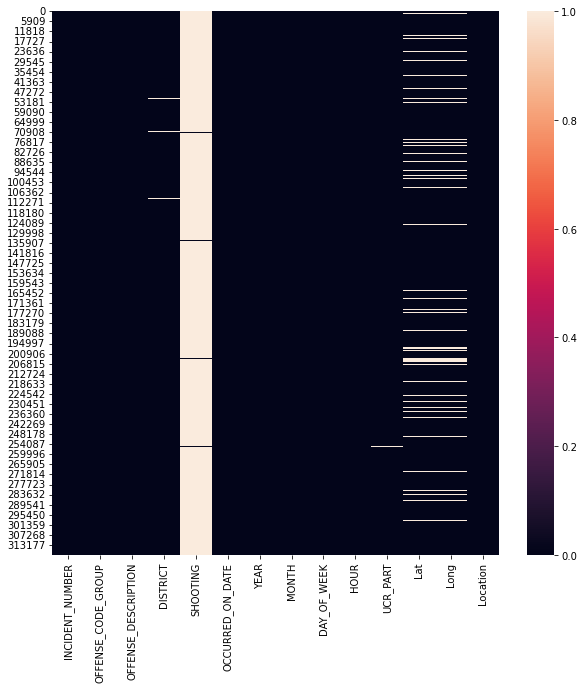

In [448]:
plt.figure(figsize=(10,10))
sns.heatmap(df.isna())

Sama halnya dengan duplikasi data, missing data juga merupakan bagian dari kesalahan yang akan menganggu proses analisis. Sehingga pengecekan dan penanganan apabila ada duplikasi data perlu dilakukan. Dari penjabaran di atas dapat diketahui bahwa:
- Terdapat 4 fitur (kolom) yang memiliki presentase missing data dibawah 50 persen dan 1 fitur (kolom) data yang memiliki presentase missing data diatas 50
- Fitur SHOOTING memiliki presentase missing data paling besar yaitu sekitar 99,6%
- Hal ini menyimpulkan bahwa penanganan missing data perlu dilakukan unutk Boston Crime dataset 

**Missing Data Treatment for SHOOTING Column**

In [449]:
df.drop(columns="SHOOTING",inplace=True)

Penanganan missing data pada kolom SHOOTING: 
- Menghapus kolom SHOOTING karena hampir seluruh data kosong (99.6%)

**Missing Data Treatment for OFFENSE_CODE_GROUP Column**

In [450]:
# Check missing value
df[df["UCR_PART"].isna()]["OFFENSE_CODE_GROUP"].value_counts()

HOME INVASION                                77
HUMAN TRAFFICKING                            7 
INVESTIGATE PERSON                           4 
HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE    2 
Name: OFFENSE_CODE_GROUP, dtype: int64

In [451]:
# UCR_PART Column
df.loc[df["OFFENSE_CODE_GROUP"]=="HOME INVASION","UCR_PART"]=df.loc[df["OFFENSE_CODE_GROUP"]=="Burglary - No Property Taken","UCR_PART"].mode()[0]
df.loc[df["OFFENSE_CODE_GROUP"]=="INVESTIGATE PERSON","UCR_PART"]=df.loc[df["OFFENSE_CODE_GROUP"]=="Investigate Property","UCR_PART"].mode()[0]
df.loc[(df["OFFENSE_CODE_GROUP"]=="HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE")|(df["OFFENSE_CODE_GROUP"]=="HUMAN TRAFFICKING"),"UCR_PART"]="Part One"

Penanganan missing data pada kolom UCR_PART: 
- Mengisi missing data dengan kemiripan pada jenis tindak kriminal yang lain:
    - HOME INVASION memiliki kemiripan dengan jenis tindak kriminal yaitu Burglary - No Property Taken. Sehingga data UCR_PART untuk OFFENSE_CODE_GROUP HOME INVASION akan diisi dengan data yang sama pada OFFENSE_CODE_GROUP Burglary - No Property Taken
    - INVESTIGATE PERSON memiliki kemiripan dengan jenis tindak kriminal yaitu Investigate Property. Sehingga data UCR_PART untuk OFFENSE_CODE_GROUP INVESTIGATE PERSON akan diisi dengan data yang sama pada OFFENSE_CODE_GROUP Burglary - Investigate Property
- Mengisi missing data dengan merefrensi pada sumber lain:
    - Menurut https://www.cityoffrederickmd.gov/DocumentCenter/View/19139/May-2021-Monthly-Statistics, human trafficking dikategorikan sebagai UCR part one

**Missing Data Treatment for DISTRICT Column**

In [452]:
df["DISTRICT"]=np.where(df["DISTRICT"].isna(),df["DISTRICT"].mode(),df["DISTRICT"])

Penanganan missing data pada kolom DISTRICT: 
- Dikarenakan kolom distrik merupakan feature kategorikal, maka kolom DISTRICT dapat diisi dengan nilai modusnya

**Missing Data Treatment for Long and Lat Column**

In [453]:
df["Lat"]=df["Location"].apply(lambda x: float(re.findall("\d+.\d+",x)[0]))
df["Long"]=df["Location"].apply(lambda x: float(re.findall("\d+.\d+",x)[1])*-1)

In [454]:
df

,INCIDENT_NUMBER,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,Lat,Long,Location
0,I182070945,Larceny,LARCENY ALL OTHERS,D14,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,Vandalism,VANDALISM,C11,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,Towed,TOWED MOTOR VEHICLE,D4,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,Investigate Property,INVESTIGATE PROPERTY,D4,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,Investigate Property,INVESTIGATE PROPERTY,B3,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,42.275365,-71.090361,"(42.27536542, -71.09036101)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
319044,I050310906-00,Warrant Arrests,WARRANT ARREST,D4,2016-06-05 17:25:00,2016,6,Sunday,17,Part Three,42.336951,-71.085748,"(42.33695098, -71.08574813)"
319045,I030217815-08,Homicide,"MURDER, NON-NEGLIGIENT MANSLAUGHTER",E18,2015-07-09 13:38:00,2015,7,Thursday,13,Part One,42.255926,-71.123172,"(42.25592648, -71.12317207)"
319046,I030217815-08,Warrant Arrests,WARRANT ARREST,E18,2015-07-09 13:38:00,2015,7,Thursday,13,Part Three,42.255926,-71.123172,"(42.25592648, -71.12317207)"
319047,I010370257-00,Warrant Arrests,WARRANT ARREST,E13,2016-05-31 19:35:00,2016,5,Tuesday,19,Part Three,42.302333,-71.111565,"(42.30233307, -71.11156487)"


Dikarenakan tidak ada missing value pada kolom Location maka, penanganan missing data pada kolom long and lat: 
- Mengisi kolom Lat dan Long dengan kolom Location

### 2.4 Data Duplication depend on INCIDENT_NUMBER ID

**Check Duplicate Data**

In [455]:
df["INCIDENT_NUMBER"].value_counts()

I162030584    13
I152080623    11
I172096394    10
I172013170    10
I182065208    10
              ..
I172059460    1 
I172059458    1 
I172059457    1 
I172059456    1 
142052550     1 
Name: INCIDENT_NUMBER, Length: 282517, dtype: int64

In [456]:
# Check one incident number for better insight
df[df["INCIDENT_NUMBER"]=="I162030584"].head()

,INCIDENT_NUMBER,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,Lat,Long,Location
237660,I162030584,Aggravated Assault,ASSAULT - AGGRAVATED,C11,2016-04-20 11:07:00,2016,4,Wednesday,11,Part One,42.3158,-71.060521,"(42.31580044, -71.06052053)"
237661,I162030584,Simple Assault,ASSAULT SIMPLE - BATTERY,C11,2016-04-20 11:07:00,2016,4,Wednesday,11,Part Two,42.3158,-71.060521,"(42.31580044, -71.06052053)"
237662,I162030584,Firearm Violations,"WEAPON - FIREARM - CARRYING / POSSESSING, ETC",C11,2016-04-20 11:07:00,2016,4,Wednesday,11,Part Two,42.3158,-71.060521,"(42.31580044, -71.06052053)"
237663,I162030584,Other,WEAPON - OTHER - OTHER VIOLATION,C11,2016-04-20 11:07:00,2016,4,Wednesday,11,Part Two,42.3158,-71.060521,"(42.31580044, -71.06052053)"
237664,I162030584,Drug Violation,DRUGS - POSS CLASS B - INTENT TO MFR DIST DISP,C11,2016-04-20 11:07:00,2016,4,Wednesday,11,Part Two,42.3158,-71.060521,"(42.31580044, -71.06052053)"


Dari penjabaran diatas dapat diketahui bahwa:
- Satu laporan tindak kriminal bisa mencakup banyak jenis kriminal (pasal berlapis). Sehingga apabila fokus analisis mengacu pada jumlah laporan tindak kriminal maka akan menimbulkan kesalahan analisis.

**Treatment for Data Duplication that depend on INCIDENT_NUMBER ID**

In [457]:
df_laporan_kriminal=df.copy()
df_laporan_kriminal.sort_values("INCIDENT_NUMBER",inplace=True)
df_laporan_kriminal.drop_duplicates(subset="INCIDENT_NUMBER",keep="first",ignore_index=True,inplace=True)
df_laporan_kriminal.drop(columns=["OFFENSE_CODE_GROUP","OFFENSE_DESCRIPTION"])
df_laporan_kriminal["INCIDENT_NUMBER"].value_counts()

142052550     1
I172065241    1
I172065248    1
I172065246    1
I172065245    1
             ..
I162058045    1
I162058046    1
I162058047    1
I162058049    1
I182070945    1
Name: INCIDENT_NUMBER, Length: 282517, dtype: int64

Penanganan duplikasi data yang berkaitan dengan INCIDENT_NUMBER ID:
- Karena terdapat analisis yang berfokus pada distribusi jenis tindak kriminal maka diputuskan untuk tidak menghapus INCIDENT_NUMBER yang terduplikat.
- Membuat dataframe baru yang dimana isinya hanya ada satu INCIDENT_NUMBER ID (df_laporan_kriminal). Artinya, apabila terdapat dua atau lebih INCIDENT_NUMBER ID maka hanya akan mengambil baris yang paling atas. Ini juga berarti kolom "OFFENSE_CODE_GROUP" dan "OFFENSE_DESCRIPTION" akan di drop pada dataframe ini
- Pada dataframe df_laporan_kriminal terlihat bahwa sebenarnya total laporan tindak kriminal yang terjadi di boston selama periode 2015 hingga 2018 adalah 282517 kasus

### 2.5 Final Editing and Clean Data Preview

**Final Missing Value Check**

In [458]:
df.isna().sum()

INCIDENT_NUMBER        0
OFFENSE_CODE_GROUP     0
OFFENSE_DESCRIPTION    0
DISTRICT               0
OCCURRED_ON_DATE       0
YEAR                   0
MONTH                  0
DAY_OF_WEEK            0
HOUR                   0
UCR_PART               0
Lat                    0
Long                   0
Location               0
dtype: int64

**Main Dataframe (df)** 

In [459]:
# Change upper value to lower for df
df["OFFENSE_CODE_GROUP"]=df["OFFENSE_CODE_GROUP"].apply(lambda x: x.lower())
df["OFFENSE_DESCRIPTION"]=df["OFFENSE_DESCRIPTION"].apply(lambda x: x.lower())
df["DAY_OF_WEEK"]=df["DAY_OF_WEEK"].apply(lambda x: x.lower())
df["UCR_PART"]=df["UCR_PART"].apply(lambda x: str(x).lower())
df.head()

,INCIDENT_NUMBER,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,Lat,Long,Location
0,I182070945,larceny,larceny all others,D14,2018-09-02 13:00:00,2018,9,sunday,13,part one,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,vandalism,vandalism,C11,2018-08-21 00:00:00,2018,8,tuesday,0,part two,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,towed,towed motor vehicle,D4,2018-09-03 19:27:00,2018,9,monday,19,part three,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,investigate property,investigate property,D4,2018-09-03 21:16:00,2018,9,monday,21,part three,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,investigate property,investigate property,B3,2018-09-03 21:05:00,2018,9,monday,21,part three,42.275365,-71.090361,"(42.27536542, -71.09036101)"


**Dataframe with nunique INCIDENT_NUMBER (df_laporan_kriminal)** 

In [460]:
# Change upper value to lower for df_laporan_kriminal
df_laporan_kriminal["OFFENSE_CODE_GROUP"]=df["OFFENSE_CODE_GROUP"].apply(lambda x: x.lower())
df_laporan_kriminal["OFFENSE_DESCRIPTION"]=df["OFFENSE_DESCRIPTION"].apply(lambda x: x.lower())
df_laporan_kriminal["DAY_OF_WEEK"]=df["DAY_OF_WEEK"].apply(lambda x: x.lower())
df_laporan_kriminal["UCR_PART"]=df["UCR_PART"].apply(lambda x: str(x).lower())
df_laporan_kriminal.head()

,INCIDENT_NUMBER,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,Lat,Long,Location
0,142052550,larceny,larceny all others,D4,2015-06-22 00:12:00,2015,6,sunday,0,part one,42.333839,-71.080290,"(42.33383935, -71.08029038)"
1,I010370257-00,vandalism,vandalism,E13,2016-05-31 19:35:00,2016,5,tuesday,19,part two,42.302333,-71.111565,"(42.30233307, -71.11156487)"
2,I030217815-08,towed,towed motor vehicle,E18,2015-07-09 13:38:00,2015,7,monday,13,part three,42.255926,-71.123172,"(42.25592648, -71.12317207)"
3,I050310906-00,investigate property,investigate property,D4,2016-06-05 17:25:00,2016,6,monday,17,part three,42.336951,-71.085748,"(42.33695098, -71.08574813)"
4,I060168073-00,investigate property,investigate property,E13,2018-01-27 14:01:00,2018,1,monday,14,part three,42.322838,-71.100967,"(42.32283759, -71.10096723)"


## 3 General Data Analysis
Bab ini menerangkan hasil analisis Boston crime dataset secara general dimana tidak terpesifikasi terhadap jenis tindak kriminal tertentu. Hasil analisis akan disijakan dalam bentuk tabel numerik, grafik dan juga poin-poin kesimpulan. 

### 3.1 Jenis Kejahatan yang Paling Sering Terjadi di Boston

**Distribusi Jenis Tindak Kriminal**

In [461]:
# Jumlah dan Presentase dari 5 tindak kriminal teratas yang terjadi di boston
df_distribusi_jenis_kriminal=df[["OFFENSE_CODE_GROUP","INCIDENT_NUMBER"]].groupby("OFFENSE_CODE_GROUP").count().sort_values("INCIDENT_NUMBER",ascending=False)
df_distribusi_jenis_kriminal["PERCENTAGE"]=df_distribusi_jenis_kriminal["INCIDENT_NUMBER"]*100/len(df_laporan_kriminal)

df_jumlah_kriminalitas_tahun=df_laporan_kriminal[["YEAR","INCIDENT_NUMBER"]].groupby(["YEAR"]).count().reset_index()
df_jumlah_kriminalitas_tahun["YEAR"]=df_jumlah_kriminalitas_tahun["YEAR"].apply(lambda x: str(x))

df_distribusi_jenis_kriminal.head(10)

,INCIDENT_NUMBER,PERCENTAGE
OFFENSE_CODE_GROUP,,
motor vehicle accident response,37132,13.143280
larceny,25935,9.179979
medical assistance,23540,8.332242
investigate person,18753,6.637831
other,18073,6.397137
drug violation,16545,5.856285
simple assault,15826,5.601787
vandalism,15414,5.455955
verbal disputes,13099,4.636535


In [462]:
# Jumlah dan Presentase dari 5 tindak kriminal terbawah yang terjadi di boston
df_distribusi_jenis_kriminal.tail(10)

,INCIDENT_NUMBER,PERCENTAGE
OFFENSE_CODE_GROUP,,
bomb hoax,75,0.026547
aircraft,36,0.012743
phone call complaints,31,0.010973
explosives,27,0.009557
gambling,8,0.002832
manslaughter,8,0.002832
human trafficking,7,0.002478
human trafficking - involuntary servitude,2,0.000708
biological threat,2,0.000708


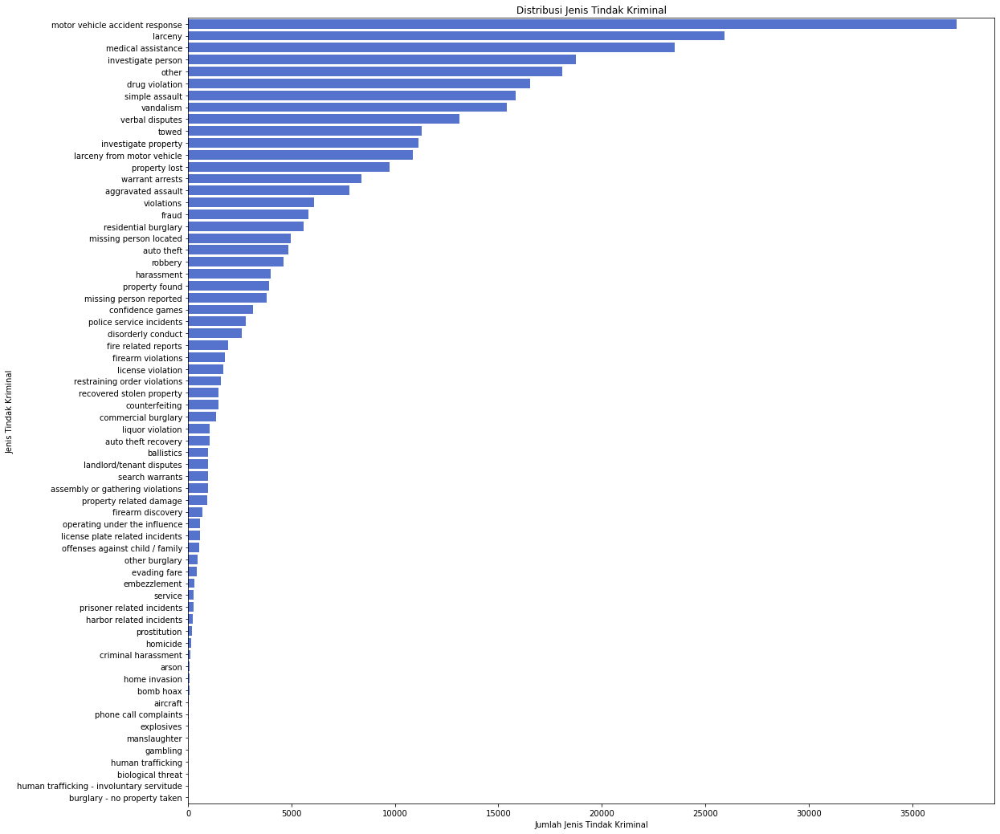

In [463]:
plt.figure(figsize=(18, 18))
sns.countplot(data=df,y="OFFENSE_CODE_GROUP",color="royalblue",order=df["OFFENSE_CODE_GROUP"].value_counts().index)
plt.title("Distribusi Jenis Tindak Kriminal")
plt.xlabel("Jumlah Jenis Tindak Kriminal")
plt.ylabel("Jenis Tindak Kriminal")
plt.show()

**Analysis Conclusion**

Dikarenakan analisis ingin berfokus pada distribusi jenis tindak kriminal maka ada baiknya apabila dataframe yang digunakan adalah dataframe yang INCIDENT_NUMBER ID-nya bisa saja terduplikasi (karena satu INCIDENT_NUMBER ID bisa memiliki beberapa OFFENSE_CODE_GROUP atau jenis tindak kriminal). Maka dari penjabaran diatas, dapat **disimpulkan** bahwa:

- 5 jenis tindak kriminal terbanyak di Boston adalah motor vehicle accident response, larceny, medical assistance, investigate person, other
- 5 jenis tindak kriminal tersedikit di Boston adalah manslaughter, human trafficking, human trafficking - involuntary servitude, biological threat, burglary - no property taken

### 3.2 Perubahan Jumlah Laporan Tindak Kriminal Selama Periode 2015 - 2018

**Jumlah Laporan Tindak Kriminal Berdasarkan Tahun**

In [464]:
df_laporan_kriminal[["YEAR","INCIDENT_NUMBER"]].groupby("YEAR").count().reset_index()

,YEAR,INCIDENT_NUMBER
0,2015,46953
1,2016,87918
2,2017,89369
3,2018,58277


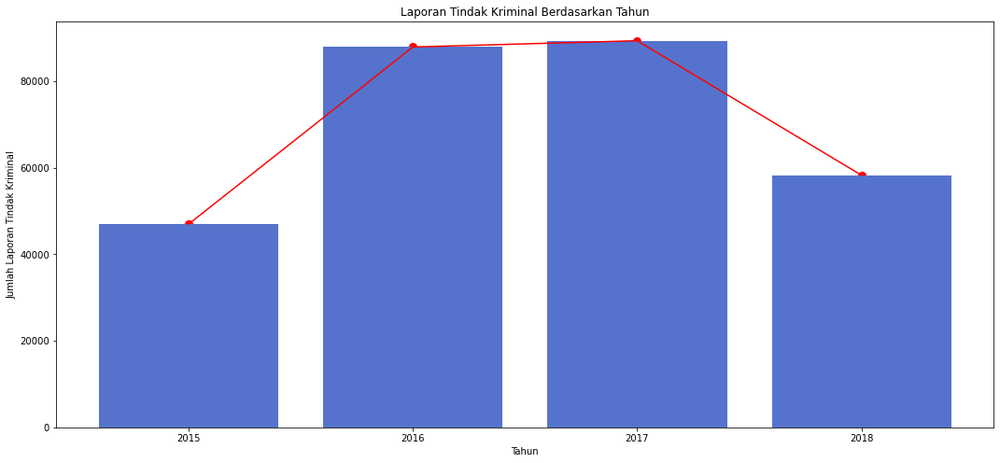

In [465]:
plt.figure(figsize=(18,8))
sns.barplot(data=df_jumlah_kriminalitas_tahun,x="YEAR",y="INCIDENT_NUMBER",color="royalblue")
sns.lineplot(data=df_jumlah_kriminalitas_tahun,x="YEAR",y="INCIDENT_NUMBER",color="red")
sns.scatterplot(data=df_jumlah_kriminalitas_tahun,x="YEAR",y="INCIDENT_NUMBER",color="red",s=100)
plt.title("Laporan Tindak Kriminal Berdasarkan Tahun")
plt.xlabel("Tahun")
plt.ylabel("Jumlah Laporan Tindak Kriminal");

**Jumlah Laporan Tindak Kriminal Berdasarkan Bulan dan Tahun**

In [466]:
df_jumlah_kriminalitas_tahun_bulan=df_laporan_kriminal[["YEAR","MONTH","INCIDENT_NUMBER"]].groupby(["YEAR","MONTH"]).count().reset_index()
for i in range(len(df_jumlah_kriminalitas_tahun_bulan)):
    df_jumlah_kriminalitas_tahun_bulan.loc[i,"YEARMONTH"]=str(df_jumlah_kriminalitas_tahun_bulan.loc[i,"YEAR"])+" "+str(calendar.month_name[df_jumlah_kriminalitas_tahun_bulan.loc[i,"MONTH"]])

df_jumlah_kriminalitas_bulan=df_laporan_kriminal[["MONTH","INCIDENT_NUMBER"]].groupby(["MONTH"]).count().reset_index()
df_jumlah_kriminalitas_bulan["MONTH"]=df_jumlah_kriminalitas_bulan["MONTH"].apply(lambda x: str(x))

In [467]:
df_laporan_kriminal[["YEAR","MONTH","INCIDENT_NUMBER"]].groupby(["YEAR","MONTH"]).count()

INCIDENT_NUMBER
YEAR MONTH                 
2015 6      3719           
     7      7284           
     8      7319           
     9      7379           
     10     7287           
     11     6898           
     12     7067           
2016 1      6898           
     2      6423           
     3      7271           
     4      7184           
     5      7646           
     6      7513           
     7      7656           
     8      7945           
     9      7617           
     10     7562           
     11     7068           
     12     7135           
2017 1      7096           
     2      6573           
     3      7217           
     4      7174           
     5      7756           
     6      7981           
     7      7996           
     8      8167           
     9      7890           
     10     7880           
     11     6968           
     12     6671           
2018 1      6870           
     2      6079           
     3      6873           
     4      6993           
     5      7912           
     6      7841           
     7      7561           
     8      7547           
     9      601

In [468]:
df_jumlah_kriminalitas_bulan.set_index("MONTH")

,INCIDENT_NUMBER
MONTH,
1,20864
2,19075
3,21361
4,21351
5,23314
6,27054
7,30497
8,30978
9,23487


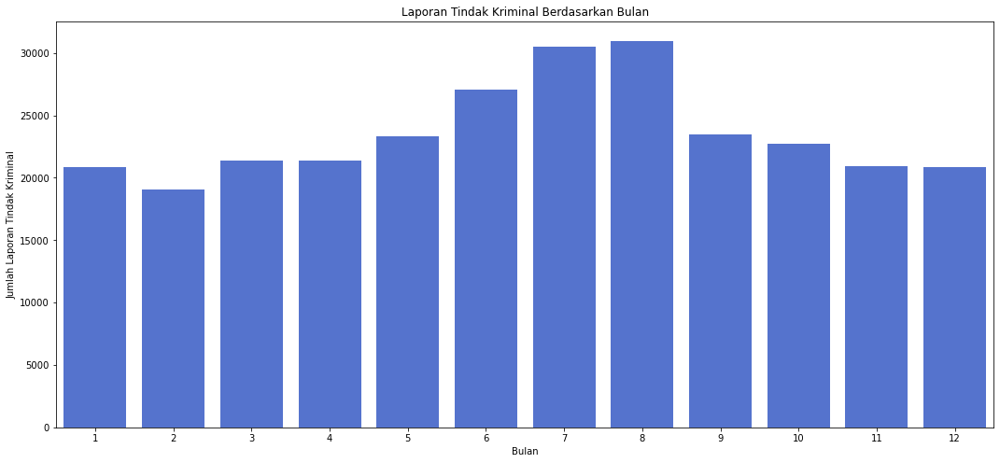

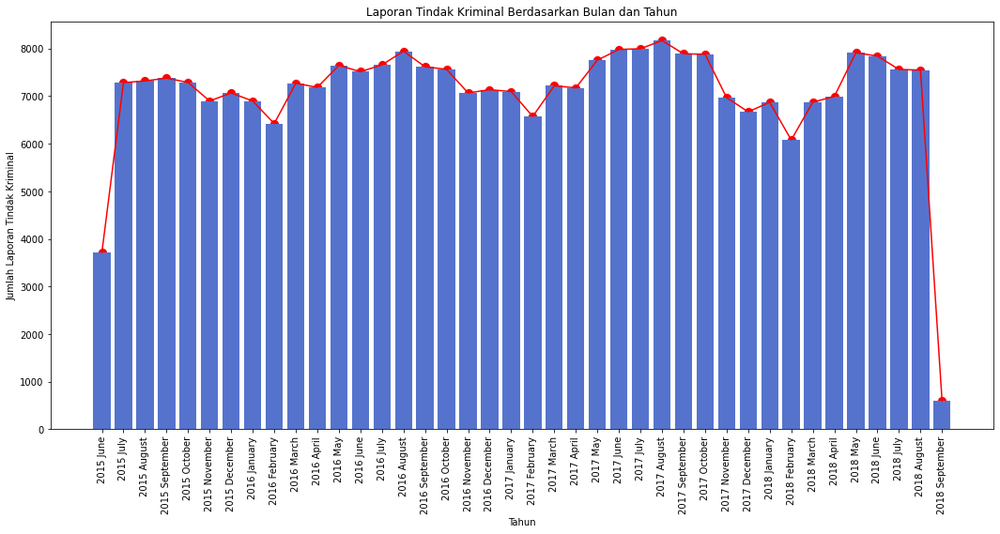

In [469]:
plt.figure(figsize=(18,8))
sns.barplot(data=df_jumlah_kriminalitas_bulan,x="MONTH",y="INCIDENT_NUMBER",color="royalblue")
plt.title("Laporan Tindak Kriminal Berdasarkan Bulan")
plt.xlabel("Bulan")
plt.ylabel("Jumlah Laporan Tindak Kriminal");

plt.figure(figsize=(18,8))
sns.barplot(data=df_jumlah_kriminalitas_tahun_bulan,x="YEARMONTH",y="INCIDENT_NUMBER",color="royalblue")
sns.lineplot(data=df_jumlah_kriminalitas_tahun_bulan,x="YEARMONTH",y="INCIDENT_NUMBER",color="red")
sns.scatterplot(data=df_jumlah_kriminalitas_tahun_bulan,x="YEARMONTH",y="INCIDENT_NUMBER",color="red",s=100)
plt.title("Laporan Tindak Kriminal Berdasarkan Bulan dan Tahun")
plt.xlabel("Tahun")
plt.xticks(rotation=90)
plt.ylabel("Jumlah Laporan Tindak Kriminal");

**Analysis Conclusion**

Visualisasi untuk analisis ini akan menggunakan dataframe yang hanya memiliki satu unique INDCIDENT_NUMBER (df_laporan_kriminal), hal ini bertujuan agar analisis berfokus pada jumlah laporan tindak kriminal bukan distribusi jenis tindak kriminal. Sehingga, visualisasi mempresentasikan jumlah laporan tindak kriminal yang sebenarnya. Maka dari penjabaran diatas, dapat **disimpulkan** bahwa:

- Missing data pada 5 bulan pertama (2015) dan 2 bulan terakhir (2018) akan mempengaruhi interpretasi, sehingga akan terlihat bahwa trend jumlah tingkat kriminalitas terus naik dari 2015 hingga 2017 namun turun pada tahun 2018.
- Tingkat kriminalitas tertinggi terjadi pada tahun 2017, namun sekali lagi kesimpulan ini tidak valid karena laporan tindak kriminal tahun 2015 dan 2018 tidak lengkap
- Terlihat juga bahwa kenaikan tingkat kriminalitas cenderung terjadi pada bulan Februari hingga Agustus di setiap tahun. Kemudian, setelah memasuki bulan September, tingkat kriminalitas cenderung akan turun hingga bulan Januari di setiap tahun.

### 3.3 Hari-Hari Rawan Terjadinya Tindak Kriminal di Boston

**Jumlah Laporan Tindak Kriminal Berdasarkan Hari Selama Periode 2015-2018**

In [470]:
df_jumlah_kriminalitas_tahun_hari=df_laporan_kriminal[["YEAR","DAY_OF_WEEK","INCIDENT_NUMBER"]].groupby(["YEAR","DAY_OF_WEEK"]).count().reset_index()
for i in range(len(df_jumlah_kriminalitas_tahun_hari)):
    df_jumlah_kriminalitas_tahun_hari.loc[i,"YEARDAY"]=str(df_jumlah_kriminalitas_tahun_hari.loc[i,"YEAR"])+" "+df_jumlah_kriminalitas_tahun_hari.loc[i,"DAY_OF_WEEK"]

df_jumlah_kriminalitas_hari=df_laporan_kriminal[["DAY_OF_WEEK","INCIDENT_NUMBER"]].groupby(["DAY_OF_WEEK"]).count().reset_index()

In [471]:
df_laporan_kriminal[["YEAR","DAY_OF_WEEK","INCIDENT_NUMBER"]].groupby(["YEAR","DAY_OF_WEEK"]).count()

INCIDENT_NUMBER
YEAR DAY_OF_WEEK                 
2015 friday       7180           
     monday       6590           
     saturday     6622           
     sunday       5949           
     thursday     7010           
     tuesday      6691           
     wednesday    6911           
2016 friday       13493          
     monday       12477          
     saturday     12425          
     sunday       11119          
     thursday     12737          
     tuesday      12866          
     wednesday    12801          
2017 friday       13378          
     monday       12975          
     saturday     12475          
     sunday       11450          
     thursday     13035          
     tuesday      12849          
     wednesday    13207          
2018 friday       8884           
     monday       8282           
     saturday     8262           
     sunday       7365           
     thursday     8702           
     tuesday      8459           
     wednesday    8323

In [472]:
df_jumlah_kriminalitas_hari.set_index("DAY_OF_WEEK")

,INCIDENT_NUMBER
DAY_OF_WEEK,
friday,42935
monday,40324
saturday,39784
sunday,35883
thursday,41484
tuesday,40865
wednesday,41242


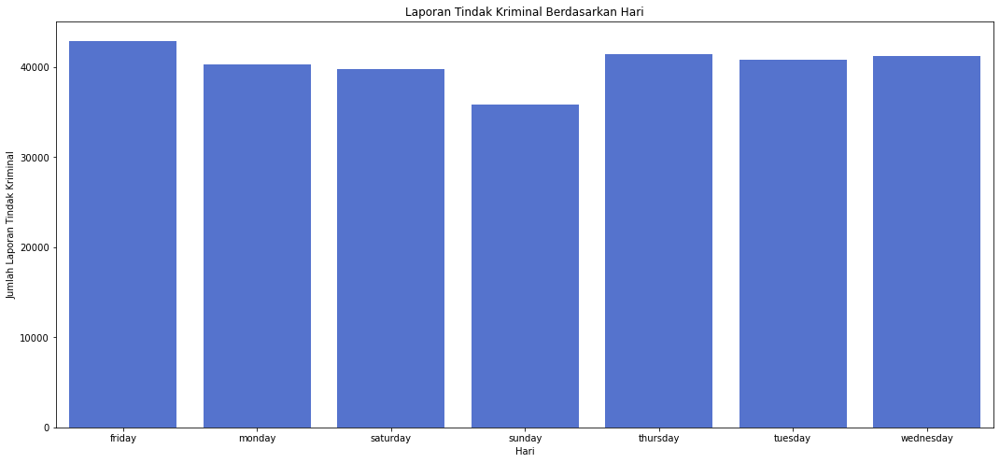

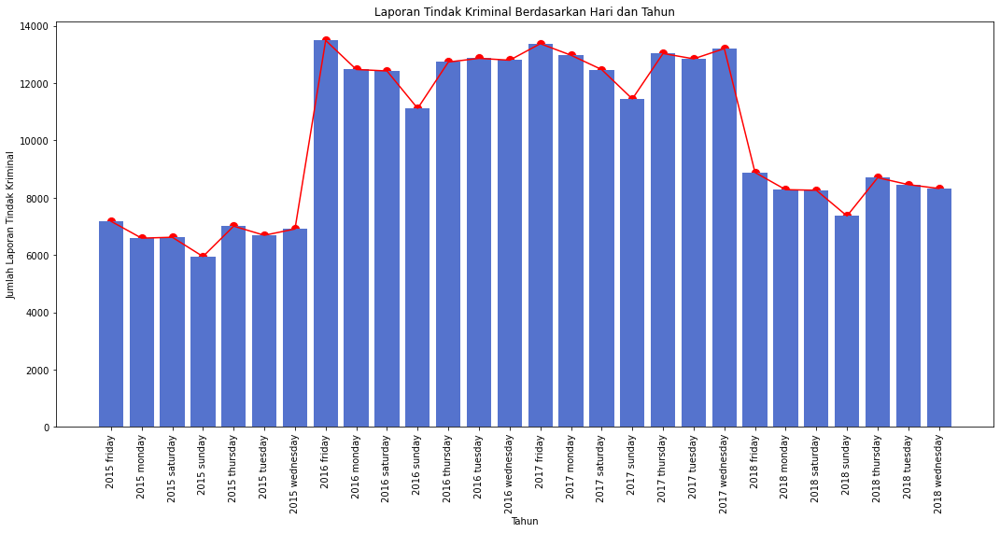

In [473]:
plt.figure(figsize=(18,8))
sns.barplot(data=df_jumlah_kriminalitas_hari,x="DAY_OF_WEEK",y="INCIDENT_NUMBER",color="royalblue")
plt.title("Laporan Tindak Kriminal Berdasarkan Hari")
plt.xlabel("Hari")
plt.ylabel("Jumlah Laporan Tindak Kriminal");

plt.figure(figsize=(18,8))
sns.barplot(data=df_jumlah_kriminalitas_tahun_hari,x="YEARDAY",y="INCIDENT_NUMBER",color="royalblue")
sns.lineplot(data=df_jumlah_kriminalitas_tahun_hari,x="YEARDAY",y="INCIDENT_NUMBER",color="red")
sns.scatterplot(data=df_jumlah_kriminalitas_tahun_hari,x="YEARDAY",y="INCIDENT_NUMBER",color="red",s=100)
plt.title("Laporan Tindak Kriminal Berdasarkan Hari dan Tahun")
plt.xlabel("Tahun")
plt.xticks(rotation=90)
plt.ylabel("Jumlah Laporan Tindak Kriminal");

**Analysis Conclusion**

Karena fokus analisis ini adalah jumlah laporan tindak kriminal, maka akan digunakan dataframe yang hanya memiliki satu unique INDCIDENT_NUMBER (df_laporan_kriminal). Maka dari penjabaran diatas, dapat **disimpulkan** bahwa:

- Hari jumat merupakan hari yang memiliki jumlah laporan tindak kriminal tertinggi di Boston selama periode 2015-2018. Mungkin hal ini disebabkan karena penduduk boston pada hari jumat menghabiskan waktu malamnya diluar (dikarenakan hari sabtu libur).
- Hari Minggu merupakan hari yang memiliki jumlah laporan tindak kriminal terendah di Boston

### 3.4 Jam atau Waktu Rawan Terjadinya Tindak Kriminal di Boston

**Jumlah Laporan Tindak Kriminal Berdasarkan Jam Selama Periode 2015-2018**

In [474]:
df_laporan_kriminal[["HOUR","INCIDENT_NUMBER"]].groupby("HOUR").count()

,INCIDENT_NUMBER
HOUR,
0,13146
1,7698
2,6542
3,3944
4,2915
5,2954
6,4479
7,8118
8,11757


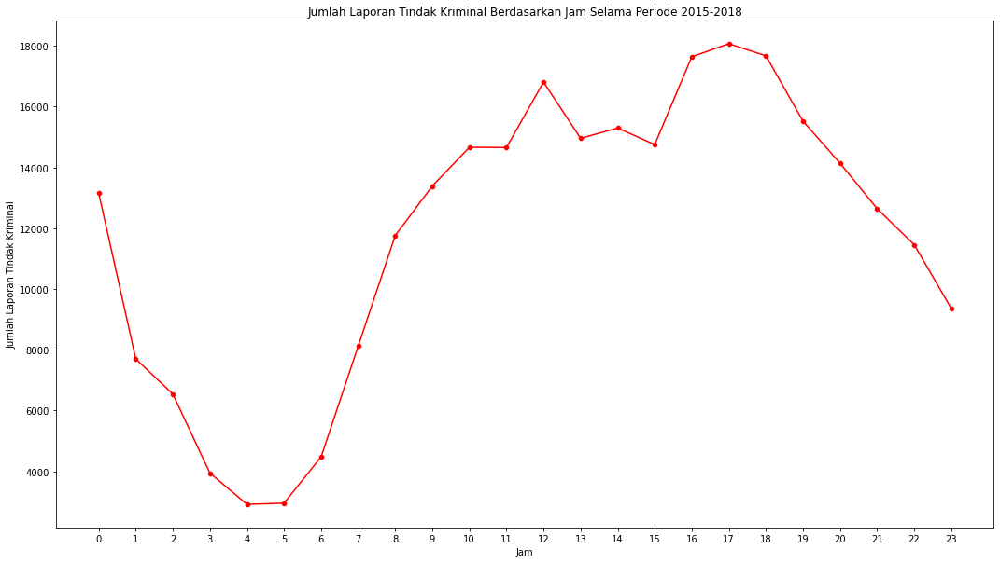

In [475]:
plt.figure(figsize=(18, 10))
sns.scatterplot(data=df_laporan_kriminal[["HOUR","INCIDENT_NUMBER"]].groupby("HOUR").count(),x="HOUR",y="INCIDENT_NUMBER",color="red")
sns.lineplot(data=df_laporan_kriminal[["HOUR","INCIDENT_NUMBER"]].groupby("HOUR").count(),x="HOUR",y="INCIDENT_NUMBER",color="red")
plt.title("Jumlah Laporan Tindak Kriminal Berdasarkan Jam Selama Periode 2015-2018")
plt.xlabel("Jam")
plt.xticks(np.arange(0, 24, step=1))
plt.ylabel("Jumlah Laporan Tindak Kriminal")
plt.show()

**Heatmap Jumlah Laporan Tindak Kriminal Berdasarkan Jam dan Hari Selama Periode 2015-2018**

In [476]:
pd.crosstab(index=df["DAY_OF_WEEK"], columns=df["HOUR"])

HOUR,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
DAY_OF_WEEK,,,,,,,,,,,,,,,,,,,,,
friday,2161,1275,952,532,441,485,768,1398,2041,2299,...,2601,2566,3073,3252,3009,2564,2307,2089,2160,1936
monday,2000,1058,846,583,386,417,709,1352,2046,2148,...,2485,2438,3029,3253,3089,2606,2319,2003,1634,1243
saturday,2612,1855,1827,957,672,478,530,1078,1515,1812,...,2378,2084,2445,2555,2528,2301,2131,2077,2113,1951
sunday,2400,2043,1855,1119,704,517,543,758,1123,1457,...,2029,1918,2216,2377,2326,2114,2109,1902,1728,1380
thursday,2039,1077,774,526,436,508,866,1405,2037,2325,...,2536,2531,2974,2931,3033,2510,2349,2070,1795,1492
tuesday,1897,1017,641,460,399,462,787,1418,2145,2322,...,2555,2503,3080,3241,3217,2768,2369,1925,1757,1296
wednesday,1997,942,798,412,370,444,823,1441,2135,2377,...,2605,2479,3053,3153,3098,2724,2265,2043,1738,1298


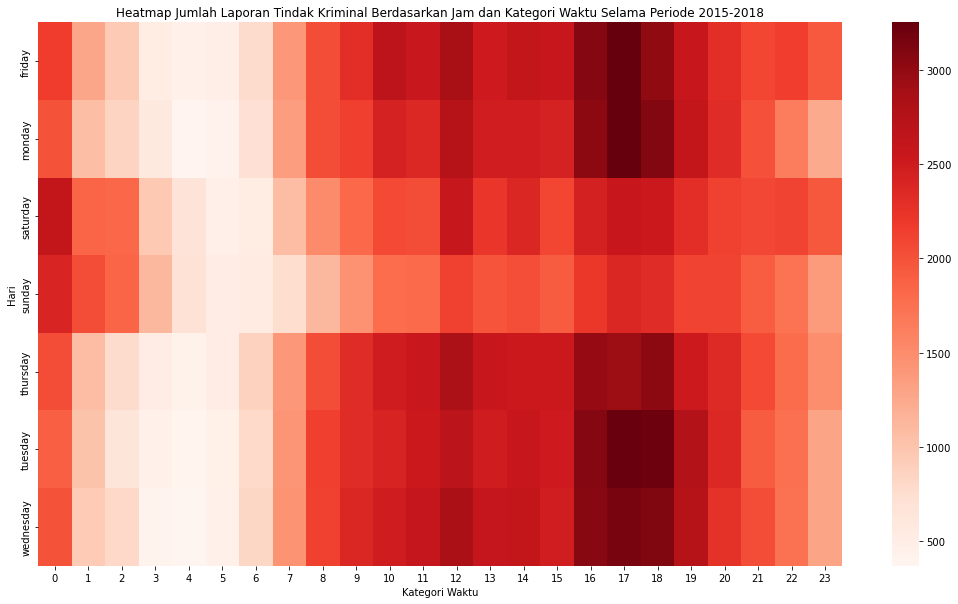

In [477]:
plt.figure(figsize=(18, 10))
sns.heatmap(pd.crosstab(index=df["DAY_OF_WEEK"], columns=df["HOUR"]), cmap = "Reds")
plt.title("Heatmap Jumlah Laporan Tindak Kriminal Berdasarkan Jam dan Kategori Waktu Selama Periode 2015-2018")
plt.xlabel("Kategori Waktu")
plt.ylabel("Hari")
plt.show()

**Jumlah Laporan Tindak Kriminal Berdasarkan Kategori Waktu Dari Periode 2015-2018**

Referensi pembagian waktu: https://kelasbahasainggris.com/pembagian-waktu-am-dan-pm/:
- Midnight: 12.00 AM (Jam 12 tengah malam)
- Late night: 12.01 AM – 4.00 AM (Jam 12.01 – 4.00 pagi)
- Morning: 4.01 AM – 11.59 AM (Jam 4.01 – 11.59 pagi)
- Noon: 12.00 PM – 1.00 PM (Jam 12.00 – 1.00 siang)
- Afternoon: 1.01 PM – 5.59 PM (Jam 1.01 – 5.59 sore)
- Evening: 6.00 PM – 7.59 PM (Jam 6.00 – 7.59 petang)
- Night: 8.00 PM – 11.59 PM (Jam 8.00 – 11.59 malam)

In [478]:
# Menambahkan TimeCategory
def time_category(x):
    if x in [0,1,2,3]:
        return "midnight and late night"
    elif x in [4,5,6,7,8,9,10,11,12]:
        return "morning and noon"
    elif x in [13,14,15,16,17,18]:
        return "afternoon"
    else:
        return "night"
    
df_laporan_kriminal.insert(9,"TIME_CATEGORY",df_laporan_kriminal["HOUR"].apply(time_category))
df.insert(9,"TIME_CATEGORY",df["HOUR"].apply(time_category))
df_laporan_kriminal.head()

,INCIDENT_NUMBER,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,TIME_CATEGORY,UCR_PART,Lat,Long,Location
0,142052550,larceny,larceny all others,D4,2015-06-22 00:12:00,2015,6,sunday,0,midnight and late night,part one,42.333839,-71.080290,"(42.33383935, -71.08029038)"
1,I010370257-00,vandalism,vandalism,E13,2016-05-31 19:35:00,2016,5,tuesday,19,night,part two,42.302333,-71.111565,"(42.30233307, -71.11156487)"
2,I030217815-08,towed,towed motor vehicle,E18,2015-07-09 13:38:00,2015,7,monday,13,afternoon,part three,42.255926,-71.123172,"(42.25592648, -71.12317207)"
3,I050310906-00,investigate property,investigate property,D4,2016-06-05 17:25:00,2016,6,monday,17,afternoon,part three,42.336951,-71.085748,"(42.33695098, -71.08574813)"
4,I060168073-00,investigate property,investigate property,E13,2018-01-27 14:01:00,2018,1,monday,14,afternoon,part three,42.322838,-71.100967,"(42.32283759, -71.10096723)"


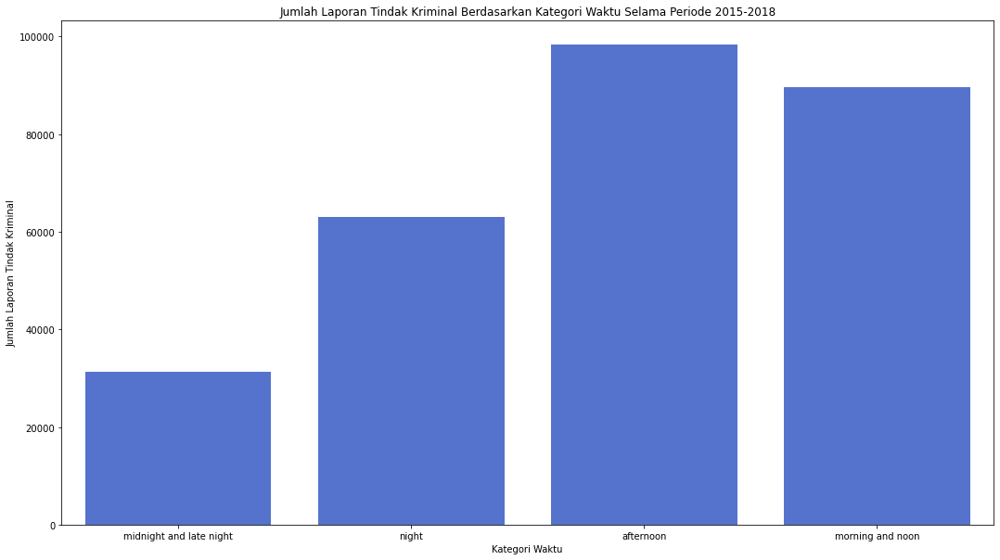

In [479]:
plt.figure(figsize=(18, 10))
sns.countplot(data=df_laporan_kriminal,x="TIME_CATEGORY",color="royalblue")
plt.title("Jumlah Laporan Tindak Kriminal Berdasarkan Kategori Waktu Selama Periode 2015-2018")
plt.xlabel("Kategori Waktu")
plt.ylabel("Jumlah Laporan Tindak Kriminal")
plt.show()

**Analysis Conclusion**

Karena fokus analisis ini adalah jumlah laporan tindak kriminal, maka akan digunakan dataframe yang hanya memiliki satu unique INDCIDENT_NUMBER (df_laporan_kriminal). Maka dari penjabaran diatas, dapat **disimpulkan** bahwa:

- Tindak kriminal umumnya terjadi pada waktu sore hari (15:00 hingga 18:00) di weekdays (Terlihat dari rata-rata jumlah laporan tindak kriminal yang tinggi dibanding kategori waktu lain dan heatmap yang berwarna gelap). Ini mungkin disebabkan karena banyak karyawan/karyawati sudah lelah selepas kerja, dan ditambah hari sudah mulai gelap. Sehingga banyak pelaku kriminal memanfaatkan situasi ini.
- Di samping itu, visualisasi diatas menunjukan bahwa tingkat kriminalitas pada waktu dini hari (01:00 hingga 5:00) rendah (Terlihat dari rata-rata jumlah laporan tindak kriminal yang rendah dibanding kategori waktu lain). Hal ini dikarenakan, kebanyakan orang pada jam tersebut sudah berada di rumah (dini hari). Namun, terlihat bahwa tingkat kriminalitas akan tinggi lagi tepat pada pukul 00.00 khususnya saat weekend.

### 3.5 Distrik di Boston yang Paling Sering Terjadi Tindak Kriminal

**Jumlah Laporan Tindak Kriminal Berdasarkan Distrik Selama Periode 2015-2018**

In [480]:
df_jumlah_kriminalitas_distrik=df_laporan_kriminal["DISTRICT"].value_counts().to_frame()
df_jumlah_kriminalitas_distrik

,DISTRICT
B2,44986
C11,37298
D4,36755
B3,31131
A1,31020
C6,21196
D14,18573
E18,15746
E13,15652
A7,12306


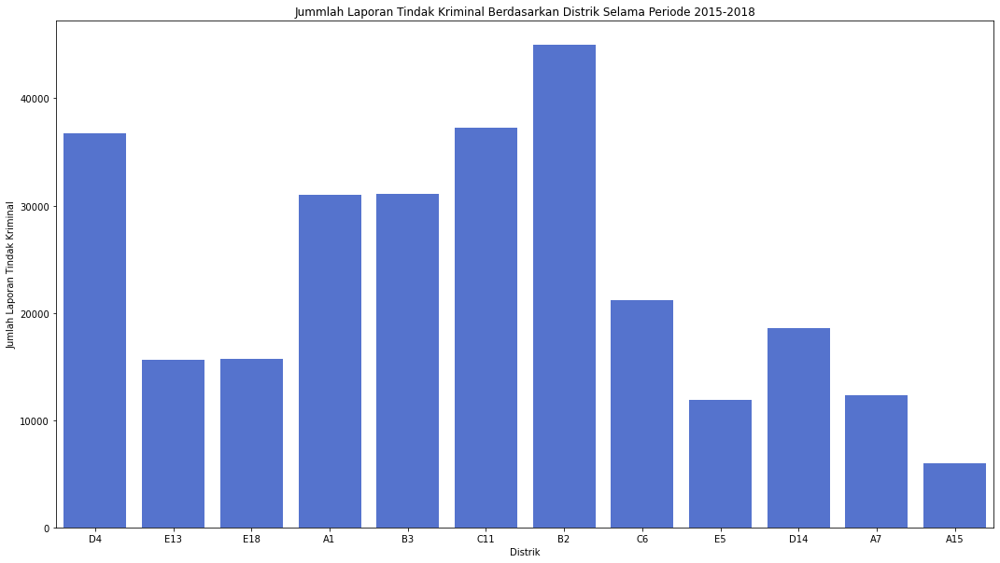

In [481]:
plt.figure(figsize=(18, 10))
sns.countplot(data=df_laporan_kriminal,x="DISTRICT",color="royalblue")
plt.title("Jummlah Laporan Tindak Kriminal Berdasarkan Distrik Selama Periode 2015-2018")
plt.xlabel("Distrik")
plt.ylabel("Jumlah Laporan Tindak Kriminal")
plt.show()

**Pemetaan Tingkat Kriminalitas di Boston Selama Periode 2015-2018**

In [482]:
boston_map = folium.Map(location=[42.35843, -71.05977], zoom_start=12)

# Create the Heat Map
#Make the list of Lat an Long
lat = df_laporan_kriminal["Lat"]
lng = df_laporan_kriminal["Long"]

d4_pin = folium.Marker(
    location=[42.34068353390052, -71.07040843019261],
    tooltip = "D4" #South End
)

e13_pin = folium.Marker(
    location=[42.30982, -71.12033],
    tooltip = "E13" #Jamaica Plain
)

e18_pin = folium.Marker(
    location=[42.2533, -71.1213],
    tooltip = "E18" #Hyde Park
)

a1_pin = folium.Marker(
    location=[42.35545959490463, -71.05687994056339],
    tooltip = "A1" #Downtown
)

b3_pin = folium.Marker(
    location=[42.26999892, -71.085499658],
    tooltip = "B3" #Mattapan
)

c11_pin = folium.Marker(
    location=[42.302708, -71.072105],
    tooltip = "C11" #Dorchester
)

b2_pin = folium.Marker(
    location=[42.3217, -71.0905],
    tooltip = "B2" #Roxbury
)

c6_pin = folium.Marker(
    location=[42.33343, -71.04949],
    tooltip = "C6" #South Boston
)

e5_pin = folium.Marker(
    location=[42.27416557, -71.142999428],
    tooltip = "E5" #West Roxbury
)

d14_pin = folium.Marker(
    location=[42.352027, -71.159935],
    tooltip = "D14" #Brighton
)

a7_pin = folium.Marker(
    location=[42.37166518, -71.036833186],
    tooltip = "A7" #East Boston
)

a15_pin = folium.Marker(
    location=[42.3718, -71.0587],
    tooltip = "A15" #Charlestown
)

HeatMap(list(zip(lat, lng)),min_opacity=0.2).add_to(boston_map)
d4_pin.add_to(boston_map)
e13_pin.add_to(boston_map)
e18_pin.add_to(boston_map)
a1_pin.add_to(boston_map)
b3_pin.add_to(boston_map)
c11_pin.add_to(boston_map)
b2_pin.add_to(boston_map)
c6_pin.add_to(boston_map)
e5_pin.add_to(boston_map)
d14_pin.add_to(boston_map)
a7_pin.add_to(boston_map)
a15_pin.add_to(boston_map)

boston_map

**Analysis Conclusion**

Karena fokus analisis ini adalah jumlah laporan tindak kriminal, maka akan digunakan dataframe yang hanya memiliki satu unique INDCIDENT_NUMBER (df_laporan_kriminal). Maka dari penjabaran diatas, dapat **disimpulkan** bahwa:

- 5 Distrik yang paling sering terjadi laporan tindak kriminal adalah B2, C11, D4, B3, A1 dengan distrik B2 sebagai distrik yang paling rawan tindak kriminal
- Pada Heatmap akan terlihat bahwa distrik A1 memiliki kelompok data (dalam hal ini jumlah laporan tindak kriminal) yang tinggi dengan distrik B2. Namun hal ini bisa saja terjadi karena distrik A1 berdekatan dengan distrik D4, sehingga bisa jadi titik/lokasi tindak kriminal bersinggungan  

## 4 Spesific Data Analysis
Bab ini menerangkan hasil analisis Boston crime dataset secara terspesifikasi dimana analsis akan mempertimbangkan **4 Tindak kriminal terbanyak yang dikategorikan sebagai tindak kriminal berat dan sedang**. Hal ini dijadikan fokus analisis karena tindak kriminal yang dikategorikan berat (part 1) dan sedang (part 2), umumnya memiliki dampak kerugian yang cukup besar dibanding tindak kriminal ringan (part 3). 

### 4.1 Analisis UCR_PART 


**Jenis Tindak Kriminal Terbanyak yang Dikategorikan Sebagai Tindak Kriminal Berat dan Sedang**

In [483]:
for x,i in enumerate(df_distribusi_jenis_kriminal.head(10).index):
    if x==0:
        df_ucr=df[df["OFFENSE_CODE_GROUP"]==i].value_counts("UCR_PART").to_frame().rename(columns={0:i})
    else:    
        df_ucr_1=df[df["OFFENSE_CODE_GROUP"]==i].value_counts("UCR_PART").to_frame().rename(columns={0:i})
        df_ucr=pd.concat([df_ucr,df_ucr_1],axis=1)
df_ucr

,motor vehicle accident response,larceny,medical assistance,investigate person,other,drug violation,simple assault,vandalism,verbal disputes,towed
UCR_PART,,,,,,,,,,
part three,37132.0,NaN,23540.0,18753.0,976.0,NaN,NaN,NaN,13099.0,11287.0
part one,NaN,25935.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
part two,NaN,NaN,NaN,NaN,17087.0,16545.0,15826.0,15414.0,NaN,NaN
other,NaN,NaN,NaN,NaN,10.0,NaN,NaN,NaN,NaN,NaN


Pada analisis awal di bab 3.1, pengelompokan jenis kriminal dilakukan agar mengetahui 10 jenis tindak kriminal terbanyak di Boston dan jumlahnya. Di bab ini akan dibahas mengenai UCR dari ke 10 jenis tindak kriminal ini. Setelah dianalisis, maka dapat disimpulkan bahwa:
- Apabila dilihat dari 10 tindak kriminal terbanyak, terdapat satu tindak kriminal yang berkategori berat (UCR part one) yaitu **larceny** dan empat tindak kriminal yang berkategori sedang (UCR part two) yaitu **other**, **drug violation**, **simple assault**, dan **vandalism**. 
- Apabila dilihat secara seksama, jenis tindak kriminal **other** memiliki beberapa UCR, hal ini disebabkan karena jenis tindak kriminal **other** merupakan kumpulan dari berbagai tindak kriminal yang belum dikategorikan. Maka dalam analisis secara spesifik ini akan hanya membahas 4 jenis tindak kriminal, yaitu **larceny**, **drug violation**, **simple assault**, dan **vandalism**

### 4.2 Keterkaitan antara Waktu Terhadap 4 Tindak Kriminal Terbanyak yang Dikategorikan Sebagai Tindak Kriminal Berat dan Sedang

**Distribusi 4 Jenis Tindak Kriminal Terbanyak yang Dikategorikan Sebagai Tindak Kriminal Berat dan Sedang Berdasarkan Kategori Waktu**

In [484]:
df_kriminal_berat_sedang = df[(df["OFFENSE_CODE_GROUP"]=="larceny")|
    (df["OFFENSE_CODE_GROUP"]=="drug violation")|
    (df["OFFENSE_CODE_GROUP"]=="simple assault")|
    (df["OFFENSE_CODE_GROUP"]=="vandalism")
]

In [485]:
df_crosstab_waktu_jenis=pd.crosstab(index=df_kriminal_berat_sedang["OFFENSE_CODE_GROUP"],columns=df_kriminal_berat_sedang["TIME_CATEGORY"])
df_crosstab_waktu_jenis

TIME_CATEGORY,afternoon,midnight and late night,morning and noon,night
OFFENSE_CODE_GROUP,,,,
drug violation,8924,1035,3239,3347
larceny,11205,1879,7913,4938
simple assault,5374,2637,3865,3950
vandalism,4469,2094,4480,4371


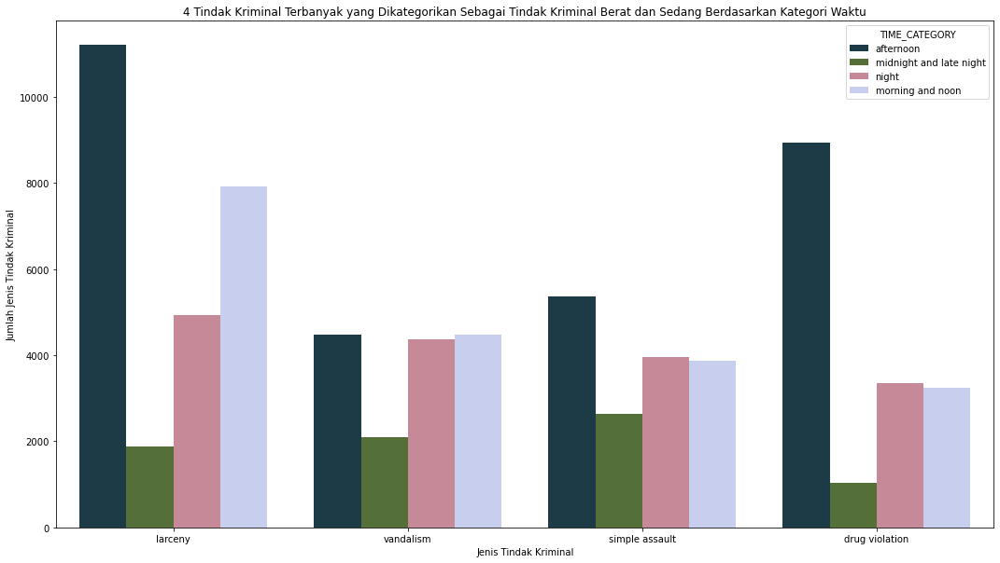

In [486]:
plt.figure(figsize=(18, 10))
sns.countplot(data=df_kriminal_berat_sedang,x="OFFENSE_CODE_GROUP",hue="TIME_CATEGORY",palette="cubehelix")
plt.title("4 Tindak Kriminal Terbanyak yang Dikategorikan Sebagai Tindak Kriminal Berat dan Sedang Berdasarkan Kategori Waktu")
plt.xlabel("Jenis Tindak Kriminal")
plt.ylabel("Jumlah Jenis Tindak Kriminal")
plt.show()

**Chi Squared Test**

Hypothesis:
- Ho: waktu dan 4 jenis tindak kriminal terbanyak yang dikategorikan sebagai tindak kriminal berat dan sedang tidak saling terkait (independence)
- Ha: waktu dan 4 jenis tindak kriminal terbanyak yang dikategorikan sebagai tindak kriminal berat dan sedang saling terkait (dependence)

In [487]:
stat_1,pvalue_chi_method_type_1,dof_1,expected_1=chi2_contingency(df_crosstab_waktu_jenis)

if pvalue_chi_method_type_1>0.05:
    print(f"""
pvalue = {pvalue_chi_method_type_1} 
pvalue > 0.05, fail to reject Ho.
""")
else:
    print(f"""
pvalue = {pvalue_chi_method_type_1} 
pvalue <= 0.05, reject Ho.
""")


pvalue = 0.0 
pvalue <= 0.05, reject Ho.



**Analysis Conclusion**

Dari Penjabaran diatas maka dapat **disimpulkan** bahwa:
- Dari hasi uji statistik, bisa dilihat bahwa waktu dan 4 jenis tindak kriminal terbanyak yang dikategorikan sebagai tindak kriminal berat dan sedang saling terkait (dependence) atau terdapat hubungan yang signifikan.
- Larceny, drug violation, and simple assault sering terjadi di sore hari. Sedangkan, vandalism umumnya terjadi di pagi hari. Hal ini mungkin saja terjadi karena larceny dan simple assault "membutuhkan korban" dalam tindak kriminalnya (induvidu lain yang menjadi korban) dimana umumnya karyawan/karyawati pulang pada waktu sore hari sedangkan vandalism tidak (perusakan properti).

### 4.2 Keterkaitan antara Distrik Terhadap 4 Tindak Kriminal Terbanyak yang Dikategorikan Sebagai Tindak Kriminal Berat dan Sedang

**Distribusi 4 Jenis Tindak Kriminal Terbanyak yang Dikategorikan Sebagai Tindak Kriminal Berat dan Sedang Berdasarkan Kategori Distrik**

In [488]:
df_crosstab_distrik_jenis=pd.crosstab(index=df_kriminal_berat_sedang["OFFENSE_CODE_GROUP"],columns=df_kriminal_berat_sedang["DISTRICT"])
df_crosstab_distrik_jenis

DISTRICT,A1,A15,A7,B2,B3,C11,C6,D14,D4,E13,E18,E5
OFFENSE_CODE_GROUP,,,,,,,,,,,,
drug violation,2075,327,901,2432,1508,2209,1808,691,2027,1083,779,705
larceny,4704,502,744,2945,1212,2183,1910,1620,7313,1203,968,631
simple assault,2320,258,684,2554,1830,2125,1067,850,2218,718,711,491
vandalism,1204,391,803,2487,1915,2409,1190,1032,1755,824,757,647


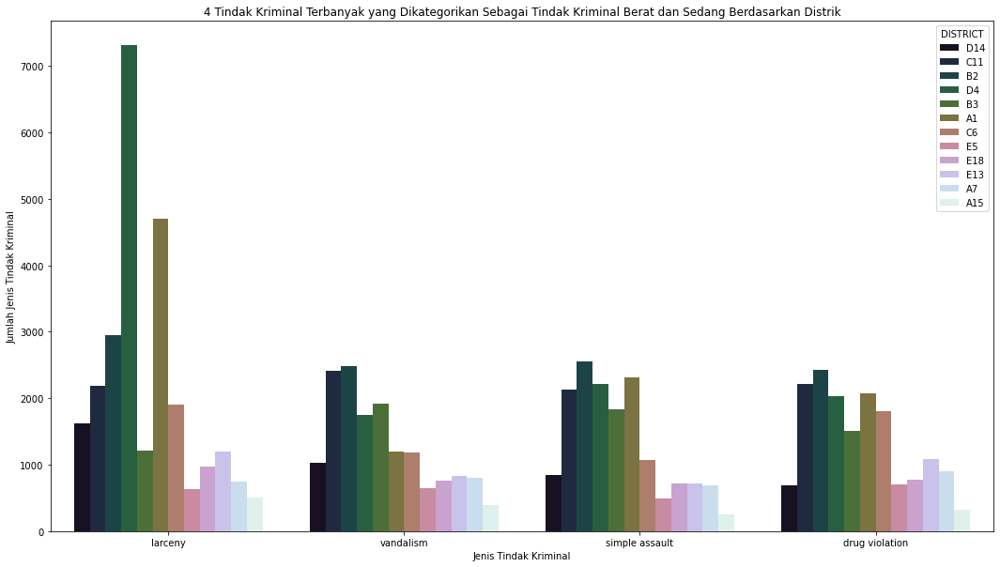

In [489]:
plt.figure(figsize=(18, 10))
sns.countplot(data=df_kriminal_berat_sedang,x="OFFENSE_CODE_GROUP",hue="DISTRICT",palette="cubehelix")
plt.title("4 Tindak Kriminal Terbanyak yang Dikategorikan Sebagai Tindak Kriminal Berat dan Sedang Berdasarkan Distrik")
plt.xlabel("Jenis Tindak Kriminal")
plt.ylabel("Jumlah Jenis Tindak Kriminal")
plt.show()

**Pemetaan Distribusi 4 Tindak Kriminal Terbanyak yang Dikategorikan Sebagai Tindak Kriminal Berat dan Sedang di Boston**

In [490]:
boston_map = folium.Map(location=[42.35843, -71.05977], zoom_start=12)

# Create the Heat Map
#Make the list of Lat an Long
lat = df_kriminal_berat_sedang["Lat"]
lng = df_kriminal_berat_sedang["Long"]

d4_pin = folium.Marker(
    location=[42.34068353390052, -71.07040843019261],
    tooltip = "D4" #South End
)

e13_pin = folium.Marker(
    location=[42.30982, -71.12033],
    tooltip = "E13" #Jamaica Plain
)

e18_pin = folium.Marker(
    location=[42.2533, -71.1213],
    tooltip = "E18" #Hyde Park
)

a1_pin = folium.Marker(
    location=[42.35545959490463, -71.05687994056339],
    tooltip = "A1" #Downtown
)

b3_pin = folium.Marker(
    location=[42.26999892, -71.085499658],
    tooltip = "B3" #Mattapan
)

c11_pin = folium.Marker(
    location=[42.302708, -71.072105],
    tooltip = "C11" #Dorchester
)

b2_pin = folium.Marker(
    location=[42.3217, -71.0905],
    tooltip = "B2" #Roxbury
)

c6_pin = folium.Marker(
    location=[42.33343, -71.04949],
    tooltip = "C6" #South Boston
)

e5_pin = folium.Marker(
    location=[42.27416557, -71.142999428],
    tooltip = "E5" #West Roxbury
)

d14_pin = folium.Marker(
    location=[42.352027, -71.159935],
    tooltip = "D14" #Brighton
)

a7_pin = folium.Marker(
    location=[42.37166518, -71.036833186],
    tooltip = "A7" #East Boston
)

a15_pin = folium.Marker(
    location=[42.3718, -71.0587],
    tooltip = "A15" #Charlestown
)

HeatMap(list(zip(lat, lng)),min_opacity=0.2).add_to(boston_map)
d4_pin.add_to(boston_map)
e13_pin.add_to(boston_map)
e18_pin.add_to(boston_map)
a1_pin.add_to(boston_map)
b3_pin.add_to(boston_map)
c11_pin.add_to(boston_map)
b2_pin.add_to(boston_map)
c6_pin.add_to(boston_map)
e5_pin.add_to(boston_map)
d14_pin.add_to(boston_map)
a7_pin.add_to(boston_map)
a15_pin.add_to(boston_map)

boston_map

**Chi Squared Test**

In [491]:
stat_2,pvalue_chi_method_type_2,dof_2,expected_2=chi2_contingency(df_crosstab_distrik_jenis)

if pvalue_chi_method_type_2>0.05:
    print(f"""
pvalue = {pvalue_chi_method_type_2} 
pvalue > 0.05, fail to reject Ho.
""")
else:
    print(f"""
pvalue = {pvalue_chi_method_type_2} 
pvalue <= 0.05, reject Ho.
""")


pvalue = 0.0 
pvalue <= 0.05, reject Ho.



**Analysis Conclusion**

Dari Penjabaran diatas maka dapat **disimpulkan** bahwa:
- Dari hasi uji statistik, bisa dilihat bahwa waktu dan 4 jenis tindak kriminal terbanyak yang dikategorikan sebagai tindak kriminal berat dan sedang saling terkait (dependence) atau terdapat hubungan yang signifikan.
- Tindak kriminal larceny sangat sering terjadi di distrik D4 dan A1. Hal ini mungkin disebabkan karena kedua distrik ini merupakan pusat kota (downtown area) dimana tingkat ekonomi di daerah downtown mungkin lebih tinggi dibanding daerah lain. Sedangkan tindak kriminal seperti drug violation, simple assault, vandilsm, dan other lebih sering terjadi di distrik B2. 

## 5. Conclusion and Recommendation

### 5.1 Cnclusion
Dari hasil analisis Boston Crime dataset secara general, maka secara keseluruhan dapat disimpulkan bahwa:

**General Data Analysis**
- Jenis tindak kriminal yang sering terjadi di Boston adalah motor vehicle accident response, larceny, medical assistance, investigate person, other.
- Tingkat kriminal tertinggi tercatat pada tahun 2017. Namun, penarikan kesimpulan ini berlaku apabila hanya membandingkan dua dataset yang lengkap yaitu tahun 2016 dan 2017.
- Tindak kriminal di Boston akan cenderung lebih sering terjadi di bulan Februari hingga Agustus.
- Tindak kriminal di Boston juga akan cenderung lebih sering terjadi di sore hari khususnya pada pukul 15:00 hingga 18:00. 
- Tindak kriminal di Boston juga akan cenderung lebih sering terjadi di distrik B2, C11, D4, B3, A1. 


**Spesific Data Analysis (hanya melihat 4 jenis tindak kriminal terbanyak berkategori Berat dan Sedang)**
- Larceny, drug violation, and simple assault lebih cenderung terjadi di sore hari. Sedangkan, vandalism lebih cenderung terjadi terjadi di malam hari. 
- Larceny lebih cenderung terjadi terjadi di distrik D4 dan A1. Sedangkan drug violation, simple assault, dan vandilsm lebih cenderung terjadi di distrik B2.
 

### 5.2 Recommendation

Dari hasil penarikan kesimpulan analisis Boston Crime dataset, maka beberapa rekomendasi untuk meningkatkan efektifitas pencegahan tindak kriminal:

**Recommendations According to General Data Analysis**
- Kepolisian boston sebaiknya meningkatkan keamanan di bulan Februari hingga Agustus.
- Kepolisian boston juga sebaiknya meningkatkan keamanan di sore hari khususnya ketika jam pulang kantor.
- Kepolisian boston juga sebaiknya meningkatkan keamanan pada distrik B2, C11, D4, B3, A1. 


**Recommendations According to Spesific Data Analysis (hanya melihat 4 jenis tindak kriminal terbanyak berkategori Berat dan Sedang)**
- Kepolisian Boston harus lebih fokus dalam penangan tindak kriminal Larceny, drug violation, simple assault, dan vandalism dengan alasan bahwa jenis tindak kriminal ini dikategorikan berat dan sedang. Selain itu tindak kriminal tersebut masuk kedalam 10 jenis kejahatan terbanyak di Boston.
- Apabila kepolisian Boston ingin memitigasi tindak kriminal larceny, drug violation, and simple assault, maka sebaiknya kepolisian Boston menigkatkan keamanan pada sore hari. Sedangkan, Apabila kepolisian Boston ingin memitigasi tindak kriminal vandalism maka sebaiknya kepolisian Boston menigkatkan keamanan pada pagi hari.
- Apabila kepolisian Boston ingin memitigasi tindak kriminal larceny maka sebaiknya kepolisian Boston menigkatkan keamanan di distrik D4 dan A1. Sedangkan, Apabila kepolisian Boston ingin memitigasi tindak kriminal drug violation, simple assault, dan vandilsm maka sebaiknya kepolisian Boston menigkatkan keamanan di distrik B2.

## 6. Save Clean CSV File

In [492]:
df.to_csv("crime_clean.csv")
df_laporan_kriminal.to_csv("crime_unique_incident_clean.csv")